In [1]:
from konlpy.tag import Kkma, Hannanum, Komoran, Mecab, Twitter
import sentencepiece as spm
import re
import string
from bs4 import BeautifulSoup
import urllib.request
import feedparser
import requests
from collections import defaultdict
from operator import itemgetter
from tqdm.notebook import tqdm
from itertools import product
import pandas as pd
import pickle
import nltk
from nltk import *
import matplotlib.pyplot as plt

In [2]:
def remove_whitespace(text):
    whitespace = re.compile(r'\s+')
    return whitespace.sub(r' ', text)

def remove_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'',text)

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)

def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
#                            u"\U00002702-\U000027B0"
#                            u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

def remove_punct(text):
    table=str.maketrans('','',string.punctuation)
    return text.translate(table)

def clean_korean_emoji (text):
    em = re.compile(r'[ㅠㅜㅡ>ㄷ].[ㅠㅜㅡ<ㄷ]').findall(text)
    for thing in em:
        text = text.replace(thing, thing[0]+thing[-1])
    return text

def clean_repeated_chosung (text):
    em = re.compile(r'[ㅋㄷㅎ]{3,}').findall(text)
    for thing in em:
        text = text.replace(thing, thing[:2])
    return text

def clean_number (text):
    num = re.compile(r'[0-9]+').findall(text)
    for thing in num:
        text = text.replace(thing, '<UNK>')
    return text

def clean_unicode (text):
    unicode = re.compile(r'(\xa0|\u200b)')
    return unicode.sub(r'', text)

def clean_html_elements (text):
    elems = re.compile(r'(&lt;|&gt;|&quo|%)')
    return elems.sub(r'', text)

def clean_DC_identifier (text):
    ids = re.compile(r'(dc|official|App|국내 최대 커뮤니티 포털 디시인사이드 힛갤러리 유저이슈 등 인터넷 트렌드 총 집합)')
    return ids.sub(r'', text)
def cleaning (text):
    return clean_DC_identifier(
                clean_unicode(
                            clean_repeated_chosung (
#                                 remove_punct (
                                    remove_emoji (
                                            clean_html_elements(
                                            remove_html (
                                                remove_whitespace (
                                                    remove_URL(
                                                text))))))))

In [4]:
# words에는 신조어 리스트
# sents에는 해당 커뮤니티에 해당하는 문장들.
with open('dc_LOL_newWord.pkl', 'rb') as f:
    words = pickle.load(f)
with open('DC_LOL_preprocessed.pkl', 'rb') as f:
    sents = pickle.load(f)

In [5]:
whole_sent = []
for sent in sents:
    sent = [w.replace('▁', '') for w in sent]
    sent = [w for w in sent if len(w) > 1]
    whole_sent.extend(sent)

fd = nltk.FreqDist(whole_sent)

In [6]:
tw_fd = {}
for w in words:
    tw_fd[w] = fd[w]

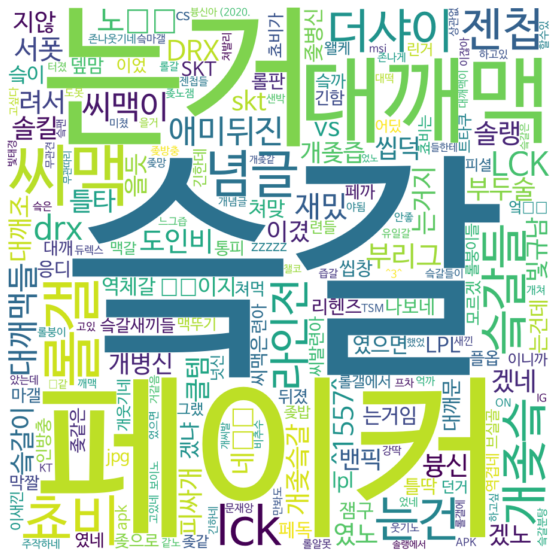

In [7]:
from wordcloud import WordCloud
from PIL import Image
import numpy as np

mask = np.array(Image.open("lck.png"))

font_path = './NanumBarunGothic.otf'
wordcloud = WordCloud(
    font_path = font_path,
    width = 900,
    height = 900,
    background_color = 'white',
    mask = mask
)
wordcloud = wordcloud.generate_from_frequencies(tw_fd)
array = wordcloud.to_array()
%matplotlib inline
fig = plt.figure(figsize=(10, 10))
plt.imshow(array, interpolation="bilinear")
plt.axis('off')
plt.show()
# fig.savefig('wordcloud_without_axisoff.png')

In [8]:
# Dynamic programming implementation of LCS problem 

# Returns length of LCS for X[0..m-1], Y[0..n-1] 
def lcs(X, Y): 
    m = len(X)
    n = len(Y)
    L = [[0 for x in range(n+1)] for x in range(m+1)] 

    # Following steps build L[m+1][n+1] in bottom up fashion. Note 
    # that L[i][j] contains length of LCS of X[0..i-1] and Y[0..j-1] 
    for i in range(m+1): 
        for j in range(n+1): 
            if i == 0 or j == 0: 
                L[i][j] = 0
            elif X[i-1] == Y[j-1]: 
                L[i][j] = L[i-1][j-1] + 1
            else: 
                L[i][j] = max(L[i-1][j], L[i][j-1]) 

    # Following code is used to print LCS 
    index = L[m][n] 

    # Create a character array to store the lcs string 
    lcs = [""] * (index+1) 
    lcs[index] = "" 

    # Start from the right-most-bottom-most corner and 
    # one by one store characters in lcs[] 
    i = m 
    j = n 
    while i > 0 and j > 0: 
        # If current character in X[] and Y are same, then 
        # current character is part of LCS 
        if X[i-1] == Y[j-1]: 
            lcs[index-1] = X[i-1] 
            i-=1
            j-=1
            index-=1

        # If not same, then find the larger of two and 
        # go in the direction of larger value 
        elif L[i-1][j] > L[i][j-1]: 
            i-=1
        else: 
            j-=1
            
    return "".join(lcs)

In [9]:
# 각 단어들을 어근 별로 묶기.
common_parts_lcs = defaultdict(set)
for i in range(len(words)):
    for j in range(i, len(words)):
        cp = lcs(words[i], words[j])
        if len(cp) > 1:
            common_parts_lcs[cp]|= set([words[i], words[j]])

In [10]:
import pprint
by_prefixes = {k:v for k,v in sorted(common_parts_lcs.items(), key = lambda x: len(x[1]), reverse = True) if len(v) > 1}
pprint.pprint(sorted(by_prefixes.items(), key = lambda x: len(x[1]), reverse = True)[:15])

[('슼갈',
  {'개좆슼갈',
   '슼갈',
   '슼갈강점기',
   '슼갈년들',
   '슼갈들',
   '슼갈들이',
   '슼갈련들',
   '슼갈분탕',
   '슼갈새끼들',
   '슼갈은',
   '슼갈이',
   '슼갈인데',
   '슼갈인척하는'}),
 ('는거', {'는거', '는거랑', '는거임', '는거보소', '는거봐', '는거지', '는거보면'}),
 ('ᄏᄏ', {'노ᄏᄏᄏ', '노ᄏᄏ', '엌ᄏᄏᄏ', '놐ᄏᄏᄏ', '노ᄏᄏᄏᄏ', '네ᄏᄏ', '엌ᄏᄏ'}),
 ('대깨', {'대깨맥들', '대깨맥이', '대깨', '대가리깨', '대깨맥', '대깨문', '대깨조'}),
 ('개좆', {'개좆밥', '개좆같', '개좆슼갈', '개좆즙', '개좆슼', '개씹좆', '개좆병신'}),
 ('씨맥', {'씨맥도', '씨맥이', '씨맥은', '씨맥이랑', '씨맥', '씨맥한테'}),
 ('롤갤', {'롤갤에서', '롤갤에', '롤갤러들', '롤갤', '롤갤러'}),
 ('슼갈들', {'슼갈들이', '슼갈년들', '슼갈새끼들', '슼갈련들', '슼갈들'}),
 ('깨맥', {'깨맥이들', '대깨맥들', '대깨맥이', '대깨맥', '깨맥'}),
 ('애미', {'애미창년', '애미뒤진', '애미디진', '애미터진', '느그애미'}),
 ('발아', {'씨발련아', '시발아', '시발련아', '씨발련들아', '씨발년아'}),
 ('련아', {'련들아', '씨발련아', '시발련아', '련아', '씨발련들아'}),
 ('역체', {'역체미', '역체갈', '역체팀', '역체롤', '역체원'}),
 ('웃기', {'개웃기네', '존나웃기네', 'ᄌᄂ웃기네', '웃기노'}),
 ('맥이', {'깨맥이들', '씨맥이', '대깨맥이', '씨맥이랑'})]


In [ ]:
# 각 문장 별로 어떤 신조어를 갖고 있는 지 마킹하는 sent_checker
# e.g. 이 문장은 '넛신', 'DRX' 를 가지고 있다. -> sent_checker[loc] = ['넛신', 'DRX']
sent_checker = defaultdict(list)
for i in tqdm(range(len(sents))):
    for word in words:
        if word in list(map(lambda x: x.replace('▁', ''), sents[i])):
            sent_checker[i].append(word)

In [11]:
# sent checker 저장.
import json
# with open('sent_checker.json', 'w') as f:
#     json.dump(sent_checker, f)
    
with open('DC_LOL_sent_checker.json', 'r') as f:
    sent_checker = json.load(f)

In [12]:
# 주어진 word와 가장 같이 많이 쓰이는 N개의 단어 추출.
def find_topN (sent_checker = sent_checker, words = words, by_word = None, N = 10, verbose = False):
    word = by_word
    if verbose:
        print(f'Target word: {word}')
        print(f'Word in new word list: {word in words}')
    cowords = defaultdict(int)
    for idx in list(sent_checker):
        sent = sent_checker[idx]
        if word in sent:
            for w in sent:
                cowords[w] += 1
                
    sorted_cowords = list(map(lambda x: x[0], sorted(cowords.items(), key = itemgetter(1), reverse = True)))
    new_cowords = {w : cowords[w] for w in sorted_cowords if w in words and w != word}
    TopN = dict(sorted(new_cowords.items(), key=itemgetter(1), reverse=True)[:N])
    if verbose:
        print(f'TOP {N} NEAR NEW WORDS: {TopN}')
    return TopN

In [ ]:
# 각 단어 별로 서로 다른 신조어와 관련이 있는가 를 표기함.
# (신조어 갯수 X 신조어 갯수) table이 만들어진다고 생각하면 되는데 topN에 포함되면 1, 아니면 0으로 마킹.
result = {}
for word in tqdm(words):
    topN = find_topN(by_word = word)
    temp = {w: 0  for w in words}
    for w in topN:
        temp[w] = 1
    result[word] = temp

In [13]:
# 각 단어 별로 어떤 단어와 연관이 있는 지를 나타내는 correlation 저장.
import json
# with open('DC_LOL_correlation.json', 'w') as f:
#     json.dump(result, f)
    
with open('DC_LOL_correlation.json', 'r') as f:
    result = json.load(f)

In [14]:
# 서로 topN에 드는 경우에는 mutual_pair로 취급함.
df = pd.DataFrame(result)

mutual_pair = []
for i in tqdm(range(len(words))):
    for j in range(i, len(words)):
        word1 = words[i]
        word2 = words[j]
        if df.loc[word1, word2] and df.loc[word2, word1]:
            mutual_pair.append((word1, word2))

with open('lol_mutual_pair.pkl', 'wb') as f:
    pickle.dump(mutual_pair, f)

In [15]:
import networkx as nx
g = nx.Graph()
for pair in mutual_pair:
    g.add_edge(*pair)

synset = dict(nx.all_pairs_shortest_path_length(g))
def slang_similarity (synset, w1, w2):
    if synset[w1][w2]:
        return synset[w1][w2]
    else:
        return 0
    
slang_similarity(synset, '슼갈', '젠첩')

1

In [16]:
from IPython.core.display import Image
from networkx.drawing.nx_pydot import to_pydot

d1 = to_pydot(g)
d1.set_dpi(300)
d1.set_rankdir("LR")
d1.set_margin(1)
Image(d1.create_png())